In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
train = pd.read_csv('./input/playground-series-s3e11/train.csv')
test = pd.read_csv('./input/playground-series-s3e11/test.csv')
submission = pd.read_csv('./input/playground-series-s3e11/sample_submission.csv')
train.shape, test.shape, submission.shape

((360336, 17), (240224, 16), (240224, 2))

In [30]:
display(train.info())
display(test.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 360336 entries, 0 to 360335
Data columns (total 17 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   id                          360336 non-null  int64  
 1   store_sales(in millions)    360336 non-null  float64
 2   unit_sales(in millions)     360336 non-null  float64
 3   total_children              360336 non-null  float64
 4   num_children_at_home        360336 non-null  float64
 5   avg_cars_at home(approx).1  360336 non-null  float64
 6   gross_weight                360336 non-null  float64
 7   recyclable_package          360336 non-null  float64
 8   low_fat                     360336 non-null  float64
 9   units_per_case              360336 non-null  float64
 10  store_sqft                  360336 non-null  float64
 11  coffee_bar                  360336 non-null  float64
 12  video_store                 360336 non-null  float64
 13  salad_bar     

None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 240224 entries, 0 to 240223
Data columns (total 16 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   id                          240224 non-null  int64  
 1   store_sales(in millions)    240224 non-null  float64
 2   unit_sales(in millions)     240224 non-null  float64
 3   total_children              240224 non-null  float64
 4   num_children_at_home        240224 non-null  float64
 5   avg_cars_at home(approx).1  240224 non-null  float64
 6   gross_weight                240224 non-null  float64
 7   recyclable_package          240224 non-null  float64
 8   low_fat                     240224 non-null  float64
 9   units_per_case              240224 non-null  float64
 10  store_sqft                  240224 non-null  float64
 11  coffee_bar                  240224 non-null  float64
 12  video_store                 240224 non-null  float64
 13  salad_bar     

None

In [6]:
train.head(3)

,id,store_sales(in millions),unit_sales(in millions),total_children,num_children_at_home,avg_cars_at home(approx).1,gross_weight,recyclable_package,low_fat,units_per_case,store_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,cost
0,0,8.61,3.0,2.0,2.0,2.0,10.30,1.0,0.0,32.0,36509.0,0.0,0.0,0.0,0.0,0.0,62.09
1,1,5.00,2.0,4.0,0.0,3.0,6.66,1.0,0.0,1.0,28206.0,1.0,0.0,0.0,0.0,0.0,121.80
2,2,14.08,4.0,0.0,0.0,3.0,21.30,1.0,0.0,26.0,21215.0,1.0,0.0,0.0,0.0,0.0,83.51


In [54]:
target = 'cost'
num_cols = ['store_sales(in millions)','gross_weight','units_per_case','store_sqft']
cat_cols = ['unit_sales(in millions)','total_children','num_children_at_home','avg_cars_at home(approx).1']
bool_cols = ['recyclable_package','low_fat','coffee_bar','video_store','salad_bar','prepared_food','florist']
check = train.drop('id',axis=1).copy()
check.describe()

,store_sales(in millions),unit_sales(in millions),total_children,num_children_at_home,avg_cars_at home(approx).1,gross_weight,recyclable_package,low_fat,units_per_case,store_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,cost
count,360336.000000,360336.000000,360336.000000,360336.000000,360336.000000,360336.000000,360336.000000,360336.000000,360336.000000,360336.000000,360336.000000,360336.000000,360336.000000,360336.000000,360336.000000,360336.000000
mean,6.337376,3.043881,2.456482,0.689390,2.203813,13.822071,0.568086,0.327797,18.972706,28180.333442,0.564839,0.277394,0.504807,0.504832,0.503191,99.614729
std,3.307980,0.784676,1.488992,1.214732,1.084293,4.614792,0.495343,0.469411,10.212912,5968.874074,0.495779,0.447713,0.499978,0.499977,0.499991,29.939435
min,0.510000,1.000000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,1.000000,20319.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.790000
25%,3.720000,3.000000,1.000000,0.000000,1.000000,9.710000,0.000000,0.000000,10.000000,23593.000000,0.000000,0.000000,0.000000,0.000000,0.000000,70.320000
50%,5.780000,3.000000,2.000000,0.000000,2.000000,13.600000,1.000000,0.000000,20.000000,27694.000000,1.000000,0.000000,1.000000,1.000000,1.000000,98.810000
75%,8.400000,4.000000,4.000000,1.000000,3.000000,17.700000,1.000000,1.000000,28.000000,33858.000000,1.000000,1.000000,1.000000,1.000000,1.000000,126.620000
max,22.920000,6.000000,5.000000,5.000000,4.000000,21.900000,1.000000,1.000000,36.000000,39696.000000,1.000000,1.000000,1.000000,1.000000,1.000000,149.750000


In [5]:
check.nunique()

store_sales(in millions)      1044
unit_sales(in millions)          6
total_children                   6
num_children_at_home             6
avg_cars_at home(approx).1       5
gross_weight                   384
recyclable_package               2
low_fat                          2
units_per_case                  36
store_sqft                      20
coffee_bar                       2
video_store                      2
salad_bar                        2
prepared_food                    2
florist                          2
cost                           328
dtype: int64

In [9]:
check.duplicated().sum()

0

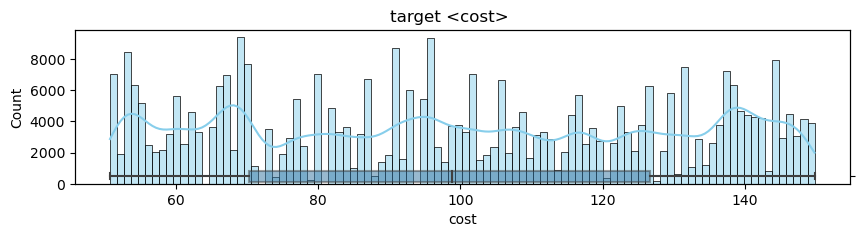

In [7]:
fig,ax = plt.subplots(figsize=(10,2))
sns.histplot(data=check, x=target, bins=100, kde=True, ax=ax, color='skyblue')
ax2 = ax.twinx()
sns.boxplot(data=check, x=target, ax=ax2, boxprops=dict(alpha=0.5))
ax2.set(ylim=(-0.5,10))
fig.suptitle('target <cost>')
plt.show()

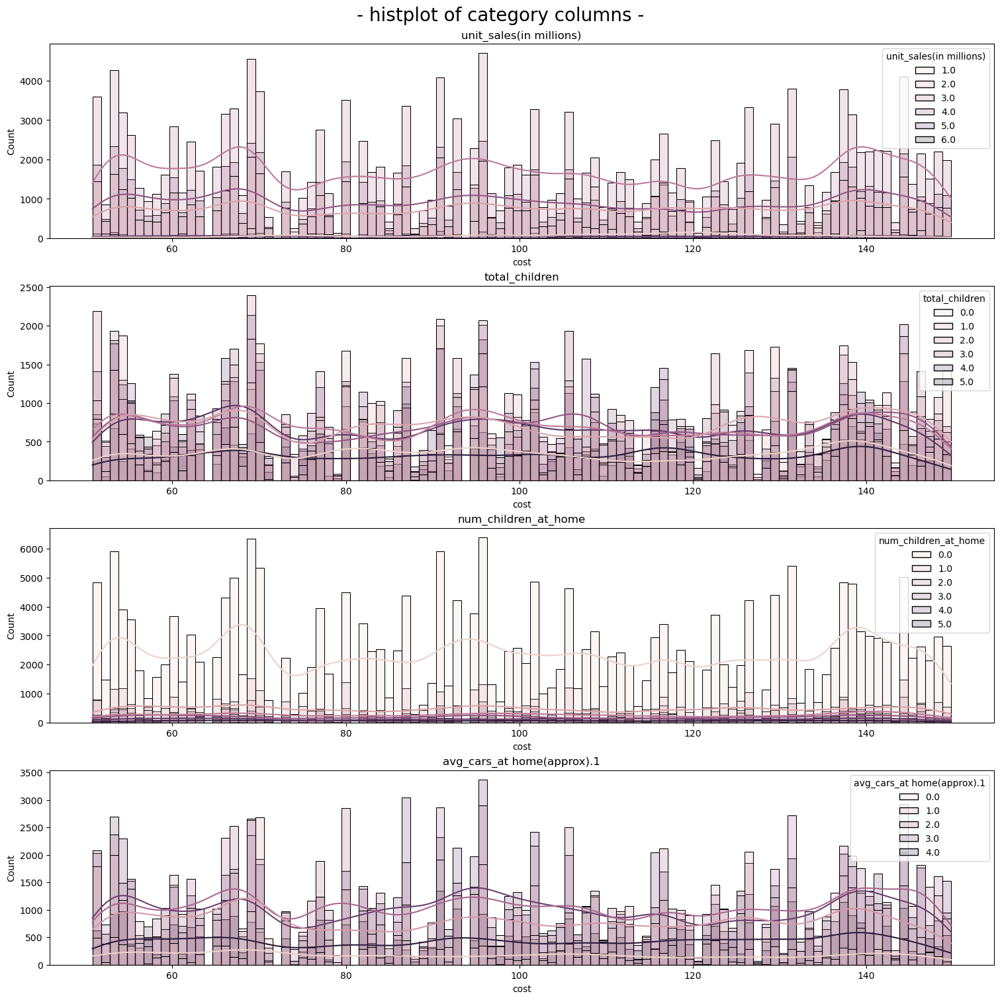

In [9]:
fig, ax = plt.subplots(4,1, figsize=(15,15), constrained_layout=True)
ax = ax.flatten()
for i,col in enumerate(cat_cols):
    sns.histplot(data=check, x=target, hue=col, bins=100, alpha=0.2, kde=True, ax=ax[i])
    ax[i].title.set_text(col)
fig.suptitle('- histplot of category columns -', fontsize=20)
plt.show()

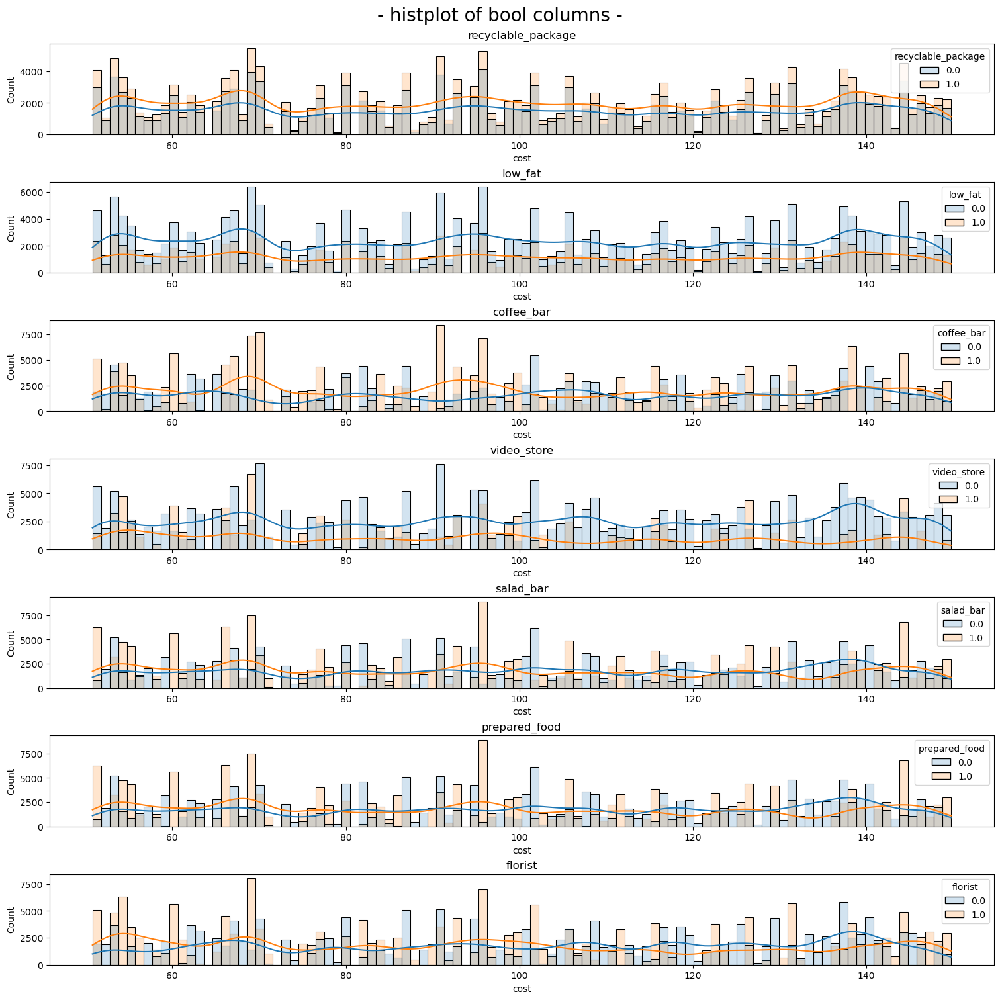

In [25]:
fig, ax = plt.subplots(7,1, figsize=(15,15), constrained_layout=True)
ax = ax.flatten()
for i,col in enumerate(bool_cols):
    sns.histplot(data=check, x=target, hue=col, bins=100, alpha=0.2, kde=True, ax=ax[i])
    ax[i].title.set_text(col)
fig.suptitle('- histplot of bool columns -', fontsize=20)
plt.show()

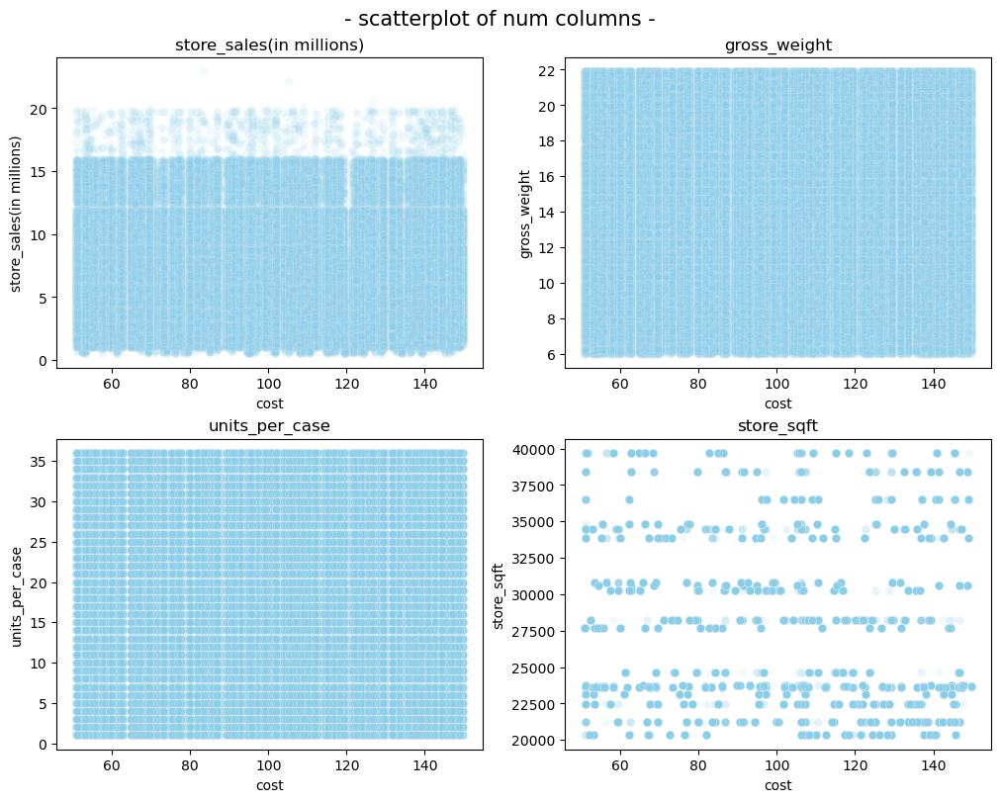

In [83]:
fig, ax = plt.subplots(2,2, figsize=(10,8), constrained_layout=True)
ax = ax.flatten()
for i,col in enumerate(num_cols):
    sns.scatterplot(data=check, x=target, y=col, ax=ax[i], alpha=0.1, c='skyblue')
    ax[i].title.set_text(col)
fig.suptitle('- scatterplot of num columns -', fontsize=15)
plt.show()

In [58]:
cut = 50
check['score_cat'] = pd.cut(check[target], cut)
group = check.groupby('score_cat')[cat_cols+bool_cols].agg(pd.Series.mode)
print(group.duplicated().sum())
# group.T

15


cost                          1.000000
avg_cars_at home(approx).1    0.027098
units_per_case                0.000180
gross_weight                 -0.000116
recyclable_package           -0.001455
num_children_at_home         -0.001727
low_fat                      -0.001975
total_children               -0.007482
store_sales(in millions)     -0.012387
unit_sales(in millions)      -0.026509
store_sqft                   -0.049201
coffee_bar                   -0.052086
salad_bar                    -0.098810
prepared_food                -0.098843
video_store                  -0.106786
florist                      -0.110414
Name: cost, dtype: float64


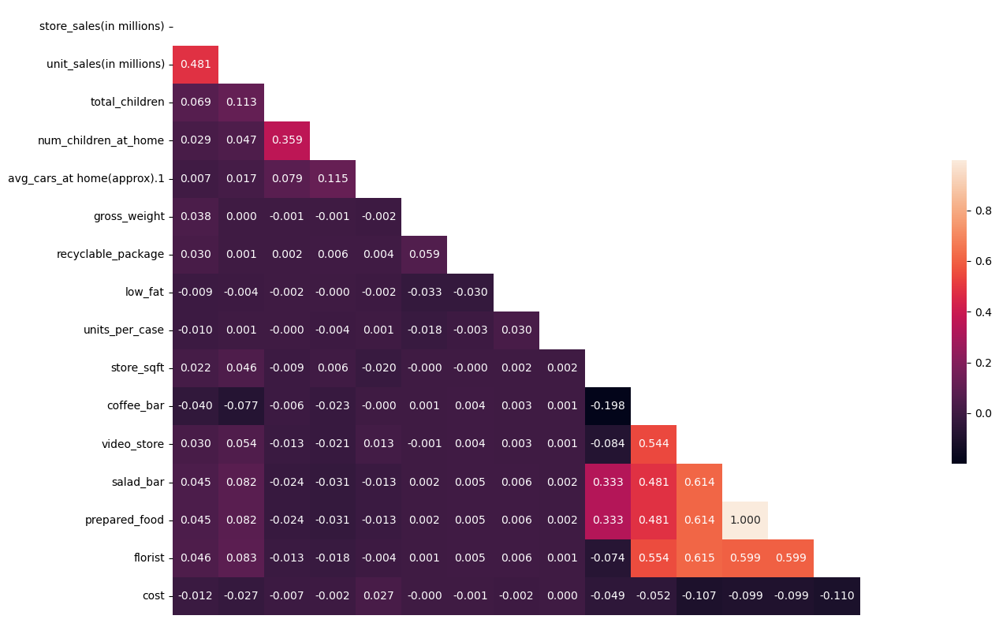

In [230]:
corr_matrix = check.corr()
print(corr_matrix[target].sort_values(ascending=False))
fig = plt.figure(figsize=(15,10))
mask = np.zeros_like(corr_matrix, dtype=bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corr_matrix, annot=True, mask=mask, fmt='.3f', xticklabels=False, cbar_kws={'shrink':.5})
plt.show()

C:\Users\Playdata\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


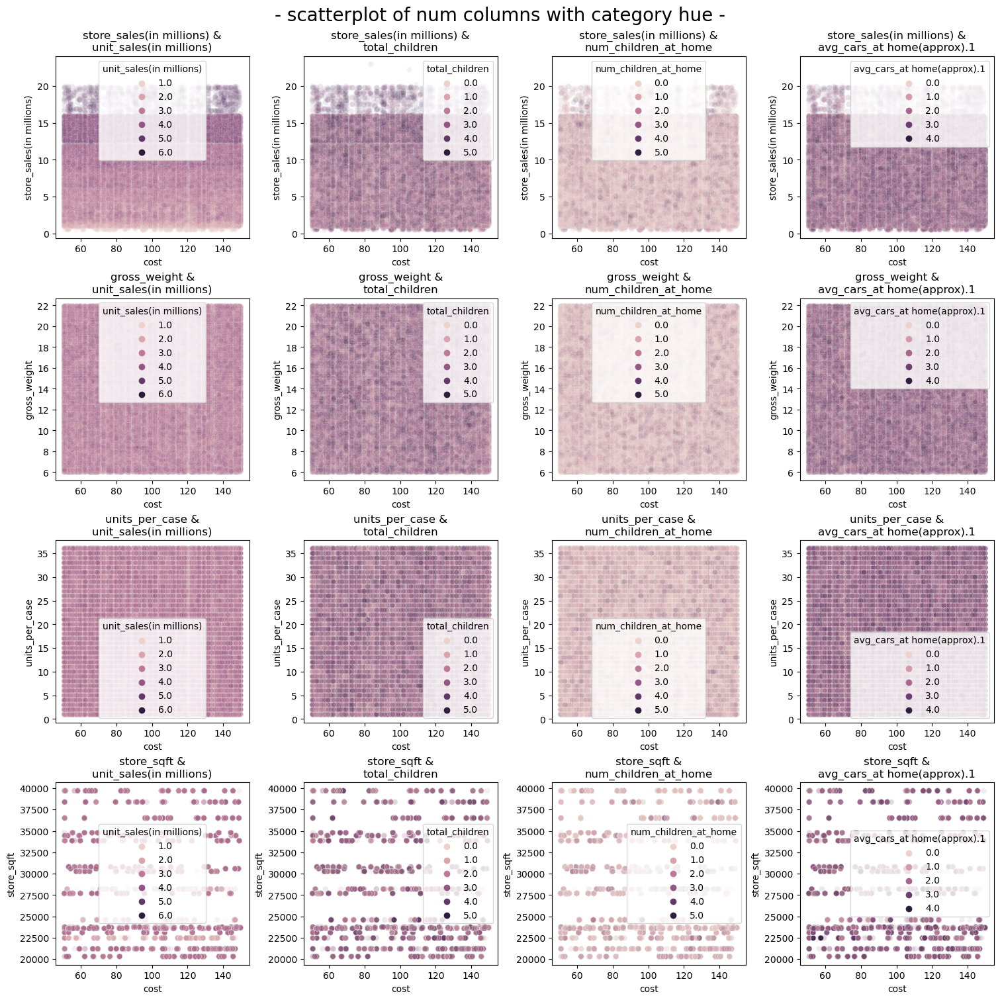

In [10]:
fig, ax = plt.subplots(4,4, figsize=(15,15), constrained_layout=True)
for i,col in enumerate(num_cols):
    for j,catcol in enumerate(cat_cols):
        sns.scatterplot(data=check, x=target, y=col, ax=ax[i][j], hue=catcol, alpha=0.1, c='skyblue')
        ax[i][j].title.set_text(col+' &\n'+catcol)
fig.suptitle('- scatterplot of num columns with category hue -', fontsize=20)
plt.show()

/opt/conda/lib/python3.7/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


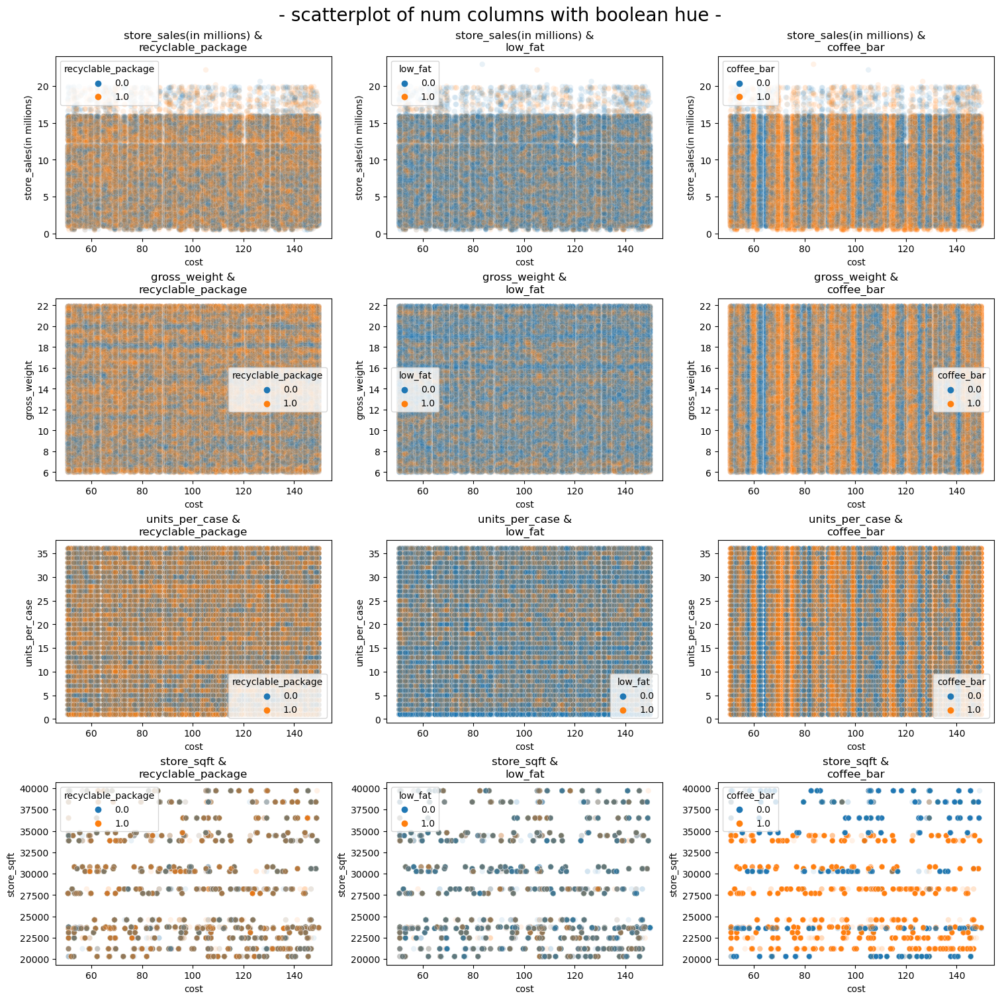

In [88]:
fig, ax = plt.subplots(4,3, figsize=(15,15), constrained_layout=True)
for i,col in enumerate(num_cols):
    for j,boolcol in enumerate(bool_cols[:3]):
        sns.scatterplot(data=check, x=target, y=col, ax=ax[i][j], hue=boolcol, alpha=0.1, c='skyblue')
        ax[i][j].title.set_text(col+' &\n'+boolcol)
fig.suptitle('- scatterplot of num columns with boolean hue -', fontsize=20)
plt.show()

/opt/conda/lib/python3.7/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


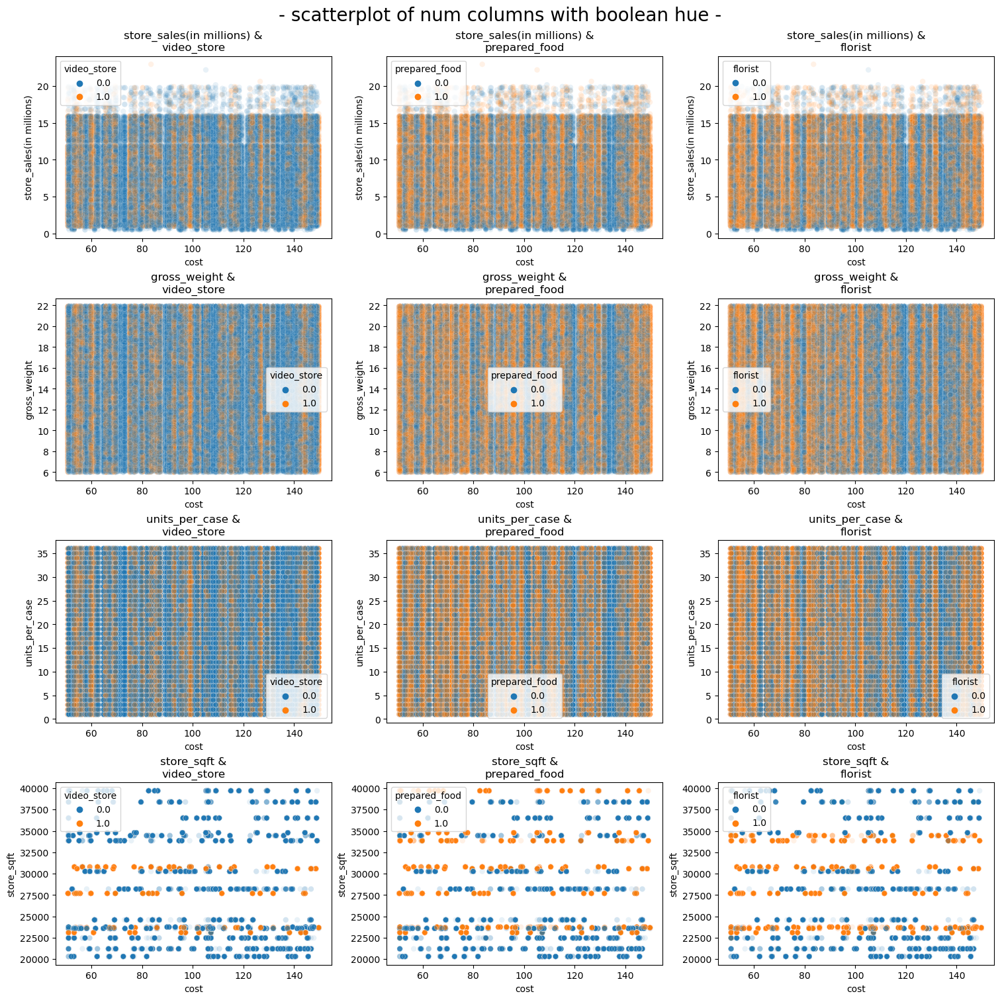

In [95]:
fig, ax = plt.subplots(4,3, figsize=(15,15), constrained_layout=True)
for i,col in enumerate(num_cols):
    for j,boolcol in enumerate([bool_cols[3]]+bool_cols[5:]):
        sns.scatterplot(data=check, x=target, y=col, ax=ax[i][j], hue=boolcol, alpha=0.1, c='skyblue')
        ax[i][j].title.set_text(col+' &\n'+boolcol)
fig.suptitle('- scatterplot of num columns with boolean hue -', fontsize=20)
plt.show()

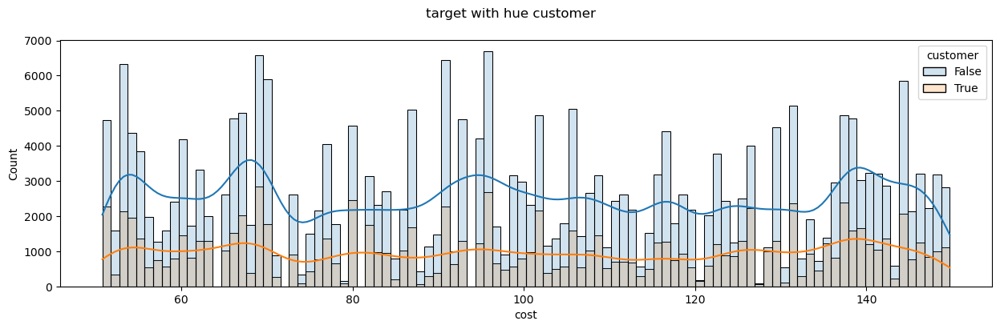

In [45]:
# total children과 num_children_at_home이 똑같으면 마켓 이용자네 집인 것으로 보임 => 아닌 듯
check['customer'] = check['total_children']==check['num_children_at_home']
fig = plt.figure(figsize=(15,4))
sns.histplot(data=check, x=target, hue='customer', bins=100, alpha=0.2, kde=True)
fig.suptitle('target with hue customer')
plt.show()
check.drop('customer', axis=1, inplace=True)

In [231]:
check['survs_sum'] = check[bool_cols[2:]].sum(axis=1)
print(check.corr()[target]['survs_sum'])
check['survs_sum'].value_counts()

-0.11225614499250082


5.0    99940
0.0    91370
1.0    80455
4.0    45382
2.0    42636
3.0      553
Name: survs_sum, dtype: int64

In [284]:
group

florist
store_sqft coffee_bar video_store salad_bar prepared_food florist         
20319      0          0           0         0             0          28851
           1          0           0         0             0            342
21215      1          0           0         0             0          31761
                                                          1             45
                                  1         1             0              1
...                                                                    ...
39696      0          0           0         0             0              1
                                  1         1             0          19500
                                                          1             67
           1          0           1         1             0             78
                                                          1             44

[111 rows x 1 columns]

In [288]:
check[['store_sqft']+bool_cols[2:]+[]] = check[['store_sqft']+bool_cols[2:]].astype('int')
group = check.groupby(['store_sqft']+bool_cols[2:])['florist'].size().to_frame()
print('store_unique 0:',len(group[group['florist']>0]))
print('store_unique 10:',len(group[group['florist']>10]))
print('store_unique 20:',len(group[group['florist']>20]))
print('store_unique 100:',len(group[group['florist']>100]))

store_unique 0: 111
store_unique 10: 59
store_unique 20: 54
store_unique 100: 33


In [297]:
# use columns: 'store_sqft','coffee_bar','video_store','salad_bar','prepared_food','florist','total_children','num_children_at_home','avg_cars_at home(approx).1'
check[['store_sqft']+bool_cols[2:]+cat_cols[1:]] = check[['store_sqft']+bool_cols[2:]+cat_cols[1:]].astype('int')
group = check.groupby(['store_sqft']+bool_cols[2:]+cat_cols[1:])['cost'].mean().sort_values().to_frame()
display(group)
print('store_unique 0:',len(group[group['cost']>0]))
print('store_unique 10:',len(group[group['cost']>10]))
print('store_unique 20:',len(group[group['cost']>20]))
print('store_unique 100:',len(group[group['cost']>100]))

cost
store_sqft coffee_bar video_store salad_bar prepared_food florist total_children num_children_at_home avg_cars_at home(approx).1        
39696      1          0           1         1             1       5              4                    4                            51.00
                                                          0       1              1                    3                            51.00
22478      1          0           0         0             1       3              0                    3                            51.00
                                                                  4              0                    2                            51.00
39696      1          0           1         1             0       2              0                    0                            51.00
...                                                                                                                                  ...
30584      1          0           0         0             0       2              0                    2                           146.72
                                                                  3              3                    2                           146.72
           0          0           0         0             1       2              1                    1                           146.72
23759      1          0           1         1             1       5              2                    0                           147.82
38382      0          0           0         0             0       3              3                    1                           148.62

[3076 rows x 1 columns]

store_unique 0: 3076
store_unique 10: 3076
store_unique 20: 3076
store_unique 100: 1702


In [242]:
check['mart'] = 0
for i,idx in enumerate(list(group.index)):
    check.loc[(check['store_sqft']==idx[0])&(check['coffee_bar']==idx[1])&(check['video_store']==idx[2])&
              (check['salad_bar']==idx[3])&(check['prepared_food']==idx[4])&(check['florist']==idx[5]), 'mart'] = i

check.corr()['mart'].sort_values(ascending=False)

mart                          1.000000
store_sqft                    0.974454
prepared_food                 0.459942
salad_bar                     0.459899
survs_sum                     0.234432
florist                       0.094297
unit_sales(in millions)       0.048798
video_store                   0.028321
store_sales(in millions)      0.024092
num_children_at_home          0.003993
low_fat                       0.002772
units_per_case                0.002125
recyclable_package           -0.000052
gross_weight                 -0.000278
total_children               -0.006838
avg_cars_at home(approx).1   -0.019938
cost                         -0.064128
coffee_bar                   -0.089329
Name: mart, dtype: float64

908


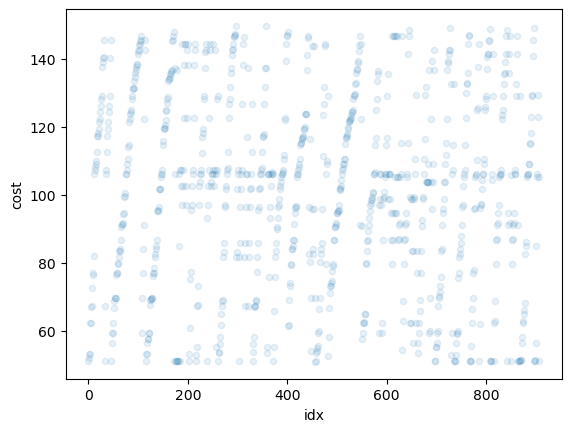

In [282]:
# group = check.groupby(['units_per_case','store_sqft']+cat_cols+bool_cols+['cost'])['cost'].mean().to_frame()
# group = check.groupby(cat_cols+bool_cols+['cost'])['cost'].mean().to_frame()
# group = check.groupby(cat_cols+['cost'])['cost'].mean().to_frame()
# group = check.groupby(bool_cols+['cost'])['cost'].mean().to_frame()
group = check.groupby(['store_sqft']+bool_cols[2:]+['cost'])['cost'].mean().to_frame()

# group.reset_index().plot.scatter(x = 'index', y = 'cose')
# group.index.to_flat_index(), group.values
print(len(group))
pd.concat([pd.DataFrame(group.values,columns=['cost']), pd.Series(np.arange(len(group)),name='idx')],axis=1).plot(kind='scatter', x='idx', y='cost',alpha=0.1)
plt.show()

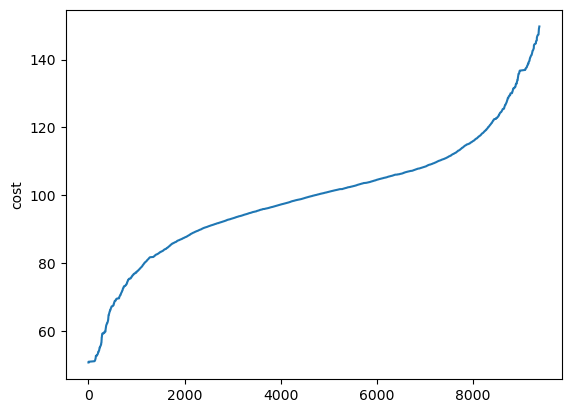

In [334]:
cat_group = check.groupby(cat_cols+bool_cols)
cat_group_cost = cat_group['cost'].mean().sort_values().to_frame().reset_index()
# cat_group_cost
sns.lineplot(data=cat_group_cost['cost'].drop_duplicates())
plt.show()

[ 7.14103768e-32 -2.23030670e-26  2.92752510e-21 -2.09810299e-16
  9.01718486e-12 -2.39713413e-07  4.31375835e-03  4.89039266e+01]


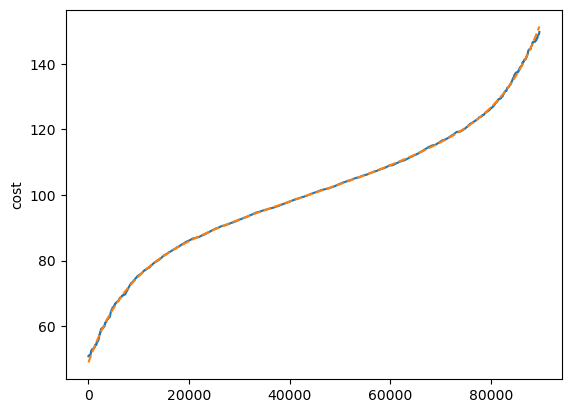

In [40]:
num_group = check.groupby(num_cols)
num_group_cost = num_group['cost'].mean().sort_values().to_frame().reset_index()
# num_group_cost

sns.lineplot(data=num_group_cost['cost'].drop_duplicates())
x = num_group_cost['cost'].drop_duplicates().index
y = num_group_cost['cost'].drop_duplicates().values
c = np.polyfit(x,y,7)
print(c)
p = np.poly1d(c)
plt.plot(x, p(x), '--')
plt.show()

In [41]:
num_group_cost

,store_sales(in millions),gross_weight,units_per_case,store_sqft,cost
0,4.76,11.90,15.0,27694.0,50.79
1,7.29,10.20,5.0,27694.0,50.79
2,17.90,10.80,28.0,27694.0,50.79
3,2.28,8.77,26.0,27694.0,50.79
4,5.60,19.30,19.0,27694.0,50.79
...,...,...,...,...,...
89723,8.60,9.01,6.0,23688.0,149.75
89724,3.32,15.70,17.0,23688.0,149.75
89725,3.86,6.14,33.0,23688.0,149.75
89726,7.62,17.10,32.0,23688.0,149.75


In [42]:
check['cat_mean'] = 0
check['num_mean'] = 0
for k,mean in zip(cat_group.groups.keys(), cat_group['cost'].mean().values):
    idxs = cat_group.groups[k]
    for i in idxs:
        check.at[i, 'cat_mean'] = mean
        
for k,mean in zip(num_group.groups.keys(), num_group['cost'].mean().values):
    idxs = num_group.groups[k]
    for i in idxs:
        check.at[i, 'num_mean'] = mean
        
check.corr()['cost'][['cat_mean','num_mean']]

KeyboardInterrupt: 

In [152]:
def getIdx(X, cols, name, target='cost'):
    if name in X.columns:
        return X
    group_mean = X.groupby(cols)[target].mean().sort_values().reset_index()
    concat_df = pd.concat([group_mean, pd.Series(np.arange(len(group_mean)),name=name)], axis=1)
    concat_df.drop(target, axis=1, inplace=True)
    return X.merge(concat_df, how='left', on=cols)
check = getIdx(check, num_cols, 'num_idx')
check = getIdx(check, cat_cols+bool_cols, 'cat_idx')

In [154]:
check.corr()['cost']

store_sales(in millions)     -0.012387
unit_sales(in millions)      -0.026509
total_children               -0.007482
num_children_at_home         -0.001727
avg_cars_at home(approx).1    0.027098
gross_weight                 -0.000116
recyclable_package           -0.001455
low_fat                      -0.001975
units_per_case                0.000180
store_sqft                   -0.049201
coffee_bar                   -0.052086
video_store                  -0.106786
salad_bar                    -0.098810
prepared_food                -0.098843
florist                      -0.110414
cost                          1.000000
num_idx                       0.520225
cat_idx                       0.285316
Name: cost, dtype: float64

[ 1.63877779e-22 -3.72838811e-17  3.33535484e-12 -1.45807866e-07
  3.65534949e-03  5.01303032e+01]


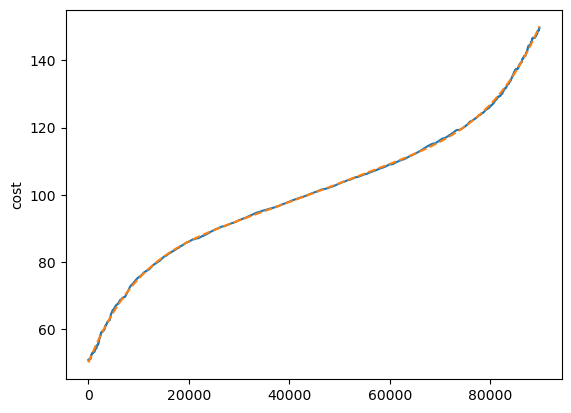

In [155]:
num_group = check.groupby(num_cols)
num_group_cost = num_group['cost'].mean().sort_values().to_frame().reset_index()
# num_group_cost

sns.lineplot(data=num_group_cost['cost'])
x = num_group_cost['cost'].index
y = num_group_cost['cost'].values
c = np.polyfit(x,y,5)
print(c)
p = np.poly1d(c)
plt.plot(x, p(x), '--')
plt.show()

In [98]:
# set 1: nothing
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
pipeline = Pipeline([
        ('std_scaler', StandardScaler())])
poly_pipeline = Pipeline([
        ('poly_features', PolynomialFeatures(degree=2, include_bias=False)),
        ('std_scaler', StandardScaler())])
X = pipeline.fit_transform(train.iloc[:,1:-1]); y = train['cost'].copy()
X_poly = poly_pipeline.fit_transform(train.iloc[:,1:-1])

In [108]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate
from sklearn.metrics import make_scorer
from sklearn.metrics import mean_squared_log_error
scoring = make_scorer(mean_squared_log_error, squared=False)
cv = 5

In [109]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet

lin_reg = LinearRegression()
sgd_reg = SGDRegressor()
p_lin_reg = LinearRegression()
p_sgd_reg = SGDRegressor()
ridge_reg = Ridge()
lasso_reg = Lasso()
elastic_reg = ElasticNet()
scores = {}
scores['lin_reg'] = cross_validate(lin_reg, X, y, scoring=scoring, cv=cv)
scores['sgd_reg'] = cross_validate(sgd_reg, X, y, scoring=scoring, cv=cv)
scores['p_lin_reg'] = cross_validate(p_lin_reg, X_poly, y, scoring=scoring, cv=cv)
scores['p_sgd_reg'] = cross_validate(p_sgd_reg, X_poly, y, scoring=scoring, cv=cv)
scores['ridge_reg'] = cross_validate(ridge_reg, X, y, scoring=scoring, cv=cv)
scores['lasso_reg'] = cross_validate(lasso_reg, X, y, scoring=scoring, cv=cv)
scores['elastic_reg'] = cross_validate(elastic_reg, X, y, scoring=scoring, cv=cv)

In [110]:
for k,v in scores.items():
    print('- {0:<14}/'.format(k), 
          'time:',round(sum(v['fit_time'])+sum(v['score_time']),3), end=' ')
    print('/ 평균:', round(v['test_score'].mean(),3))

- lin_reg       / time: 0.882 / 평균: 0.317
- sgd_reg       / time: 7.317 / 평균: 0.317
- p_lin_reg     / time: 18.767 / 평균: 0.317
- p_sgd_reg     / time: 54.412 / 평균: 0.316
- ridge_reg     / time: 0.336 / 평균: 0.317
- lasso_reg     / time: 0.922 / 평균: 0.318
- elastic_reg   / time: 0.746 / 평균: 0.318


In [147]:
'num_idx'[:3]

'num'

In [165]:
from sklearn.base import BaseEstimator, TransformerMixin

class getServscol(BaseEstimator, TransformerMixin):
    def __init__(self, prod=True, sums=True):
        self.prod = prod
        self.sums = sums
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        cols = [X.columns[i] for i in range(11,16)]
        if self.prod: 
            X['servs_TF'] = X[cols].sum(axis=1)>0
        if self.sums: 
            X['servs_count'] = X[cols].sum(axis=1)
        return X
    def get_feature_names_out(self, feature_names_in):
        return feature_names_in

class getIdxcol(BaseEstimator, TransformerMixin):
    def __init__(self, name, getIdx=True):
        self.name = name
        self.getIdx = getIdx
    def fit(self, X, y=None):
        col_idxs = [1,6,9,10] if 'num' in self.name else [2, 3, 4, 5, 7, 8, 11, 12, 13, 14, 15]
        self.cols = [X.columns[i] for i in col_idxs]
        group_mean = X.groupby(self.cols)['cost'].mean().sort_values().reset_index()
        self.concat_df = pd.concat([group_mean, pd.Series(np.arange(len(group_mean)),name=self.name)], axis=1)
        self.concat_df.drop('cost', axis=1, inplace=True)
        return self
    def transform(self, X):
        if self.name not in X.columns and self.getIdx:
            return X.merge(self.concat_df, how='left', on=self.cols)
        return X
    def get_feature_names_out(self, feature_names_in):
        return feature_names_in

class fillIdxcol(BaseEstimator, TransformerMixin):
    def __init__(self, name):
        self.name = name
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        if X[self.name].isna().sum()==0:
            return X
        col_idxs = [1,6,9,10] if 'num' in self.name else [2, 3, 4, 5, 7, 8, 11, 12, 13, 14, 15]
        cols = [X.columns[i] for i in col_idxs]
        for i in np.where(X[self.name].isna())[0]:
            empty = X.loc[i, cols+[self.name]]
            get = X[cols+[self.name]].dropna(axis=0)
            get['check'] = (get[cols]==empty[cols]).sum()
            X.at[i,self.name] = get.sort_values(by=['check'], ascending=False).at[0, self.name]
        return X
    def get_feature_names_out(self, feature_names_in):
        return feature_names_in
    
class getRegcol(BaseEstimator, TransformerMixin):
    def __init__(self, name, degree=5, getReg=True):
        self.name = name
        self.degree = degree
        self.getReg = getReg
    def fit(self, X, y=None):
        if self.name[:3]+'_idx' in X.columns:
            col_idxs = [1,6,9,10] if 'num' in self.name else [2, 3, 4, 5, 7, 8, 11, 12, 13, 14, 15]
            self.cols = [X.columns[i] for i in col_idxs]
            group_mean = X.groupby(self.cols)['cost'].mean().sort_values().reset_index()
            x, y = group_mean['cost'].index, group_mean['cost'].values
            self.poly = np.poly1d(np.polyfit(x, y, self.degree))
        return self
    def transform(self, X):
        if self.name[:3]+'_idx' in X.columns and self.getReg:
            X[self.name] = X[self.name[:3]+'_idx'].apply(lambda x: self.poly(x))
        return X
    def get_feature_names_out(self, feature_names_in):
        return feature_names_in

class transCols(BaseEstimator, TransformerMixin):
    def __init__(self, catopt, num_cols, drop_cols):
        self.catopt = catopt
        self.num_cols = num_cols
        self.drop_cols = drop_cols
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        if self.catopt:
            cat_cols = []
            for i,idx in enumerate(X.columns):
                if i not in [1,6,9,10] and idx not in ['num_idx','cat_idx','num_reg','cat_reg']+self.num_cols:
                    cat_cols.append(idx)
            X[cat_cols] = X[cat_cols].astype('str')
        for col in self.drop_cols:
            if col in X.columns:
                X.drop(col, axis=1, inplace=True)
        return X
    def get_feature_names_out(self, feature_names_in):
        return feature_names_in

In [166]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_selector
from sklearn.metrics import make_scorer
from sklearn.metrics import mean_squared_log_error
scoring = make_scorer(mean_squared_log_error, squared=False)
X, y = train.copy(), train['cost'].copy()

ct_pandas = ColumnTransformer([('ondhot', OneHotEncoder(drop='if_binary', sparse_output=False), make_column_selector(dtype_include=object))
                       ], remainder='passthrough', verbose_feature_names_out=False).set_output(transform='pandas')
mypipe = Pipeline([
                   ('createServs', getServscol(prod=True, sums=True)),
                   ('createNumIdx', getIdxcol('num_idx', getIdx=True)),
                   ('createCatIdx', getIdxcol('cat_idx', getIdx=True)),
                   ('fillNumIdx', fillIdxcol('num_idx')),
                   ('fillCatIdx', fillIdxcol('cat_idx')),
                   ('createNumReg', getRegcol('num_reg', degree=5, getReg=True)),
                   ('createCatReg', getRegcol('cat_reg', degree=5, getReg=True)),
                   ('changeType_drop', transCols(catopt = False, num_cols=['unit_sales(in millions)','servs_count'], drop_cols=['id','cost'])), # change categories dtype object
                   ('categories', ct_pandas)])

In [167]:
checkX = mypipe.fit_transform(X)
print(checkX.info())
checkX.head(3)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 360336 entries, 0 to 360335
Data columns (total 21 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   store_sales(in millions)    360336 non-null  float64
 1   unit_sales(in millions)     360336 non-null  float64
 2   total_children              360336 non-null  float64
 3   num_children_at_home        360336 non-null  float64
 4   avg_cars_at home(approx).1  360336 non-null  float64
 5   gross_weight                360336 non-null  float64
 6   recyclable_package          360336 non-null  float64
 7   low_fat                     360336 non-null  float64
 8   units_per_case              360336 non-null  float64
 9   store_sqft                  360336 non-null  float64
 10  coffee_bar                  360336 non-null  float64
 11  video_store                 360336 non-null  float64
 12  salad_bar                   360336 non-null  float64
 13  prepared_food 

,store_sales(in millions),unit_sales(in millions),total_children,num_children_at_home,avg_cars_at home(approx).1,gross_weight,recyclable_package,low_fat,units_per_case,store_sqft,...,video_store,salad_bar,prepared_food,florist,servs_TF,servs_count,num_idx,cat_idx,num_reg,cat_reg
0,8.61,3.0,2.0,2.0,2.0,10.30,1.0,0.0,32.0,36509.0,...,0.0,0.0,0.0,0.0,False,0.0,59507,4017,108.923588,97.107551
1,5.00,2.0,4.0,0.0,3.0,6.66,1.0,0.0,1.0,28206.0,...,0.0,0.0,0.0,0.0,True,1.0,65913,6003,112.865221,104.719344
2,14.08,4.0,0.0,0.0,3.0,21.30,1.0,0.0,26.0,21215.0,...,0.0,0.0,0.0,0.0,True,1.0,17097,7183,83.727523,109.520577


In [168]:
from sklearn.ensemble import RandomForestRegressor
rndFpipe = Pipeline([('preprocessing', mypipe),
                     ('rndF', RandomForestRegressor())])
rndFpipe.get_params()

{'memory': None,
 'steps': [('preprocessing',
   Pipeline(steps=[('createServs', getServscol()),
                   ('createNumIdx', getIdxcol(name='num_idx')),
                   ('createCatIdx', getIdxcol(name='cat_idx')),
                   ('fillNumIdx', fillIdxcol(name='num_idx')),
                   ('fillCatIdx', fillIdxcol(name='cat_idx')),
                   ('createNumReg', getRegcol(name='num_reg')),
                   ('createCatReg', getRegcol(name='cat_reg')),
                   ('changeType_drop',
                    transCols(catopt=False, drop_cols=['id', 'cost'],
                              num_cols=['unit_sales(in millions)',
                                        'servs_count'])),
                   ('categories',
                    ColumnTransformer(remainder='passthrough',
                                      transformers=[('ondhot',
                                                     OneHotEncoder(drop='if_binary',
                                          

In [144]:
checkpipe = rndFpipe
checkpipe.fit(X,y)
sorted(list(zip
        (checkpipe[-1].feature_importances_,checkpipe[:-1].get_feature_names_out())), reverse=True)

[(0.3911777165749344, 'num_idx'),
 (0.14718712882210172, 'cat_idx'),
 (0.09814370040644206, 'store_sales(in millions)'),
 (0.09374084876415512, 'gross_weight'),
 (0.0741603323131289, 'units_per_case'),
 (0.04046964878382962, 'total_children'),
 (0.03917961873731319, 'store_sqft'),
 (0.03440356991019004, 'avg_cars_at home(approx).1'),
 (0.023799527102189695, 'num_children_at_home'),
 (0.016521838387535005, 'unit_sales(in millions)'),
 (0.009757029940270182, 'recyclable_package'),
 (0.009360759727589825, 'low_fat'),
 (0.0074134801735742184, 'servs_count'),
 (0.0036558579968265018, 'coffee_bar'),
 (0.003511094320417225, 'florist'),
 (0.0021734907490280606, 'servs_TF'),
 (0.002068381171445132, 'video_store'),
 (0.0016433309715710872, 'salad_bar'),
 (0.0016326451474579548, 'prepared_food')]

In [145]:
# submission['cost'] = checkpipe.predict(test)
# ver = 'idxcols_rndF_ori'
# submission.to_csv('./output/submission_PGs3e11_{}.csv'.format(ver), index=False)

In [ ]:
from sklearn.model_selection import GridSearchCV
param_grid = {'preprocessing__categories__n_jobs': [-1],
              'preprocessing__createServs__prod': [True,False],
              'preprocessing__createServs__sums': [True,False],
              'preprocessing__createNumIdx__getIdx': [True,False],
              'preprocessing__createCatIdx__getIdx': [True,False],
              'preprocessing__createNumReg__degree': [5,7],
              'preprocessing__createNumReg__getReg': [True,False],
              'preprocessing__createCatReg__degree': [5,7],
              'preprocessing__createCatReg__getReg': [True,False],
              'preprocessing__changeType_drop__catopt': [True,False],
              }
rndF_gs = GridSearchCV(rndFpipe, param_grid, n_jobs=-1, cv=2, scoring=scoring, return_train_score=True)
rndF_gs.fit(X, y)
rndF_gs.best_params_, rndF_gs.best_score_

In [171]:
sorted(list(zip(
        rndF_gs.best_estimator_[-1].feature_importances_,
        rndF_gs.best_estimator_[:-1].get_feature_names_out())),reverse=True)

[(0.2064290616399043, 'num_idx'),
 (0.1899330482574339, 'num_reg'),
 (0.09650596294807626, 'store_sales(in millions)'),
 (0.09246899266454424, 'gross_weight'),
 (0.07685833222968942, 'cat_idx'),
 (0.0753487659178045, 'cat_reg'),
 (0.07261488053304094, 'units_per_case'),
 (0.039207709155635324, 'total_children'),
 (0.03834050113760609, 'store_sqft'),
 (0.033344846289622816, 'avg_cars_at home(approx).1'),
 (0.023192265442830592, 'num_children_at_home'),
 (0.015923176880305406, 'unit_sales(in millions)'),
 (0.009433778295620027, 'recyclable_package'),
 (0.009065668509446565, 'low_fat'),
 (0.007119311734688277, 'servs_count'),
 (0.00351245164729929, 'coffee_bar'),
 (0.0033705133964589806, 'florist'),
 (0.00208534204424514, 'servs_TF'),
 (0.002073039011486686, 'video_store'),
 (0.0016004722794842605, 'prepared_food'),
 (0.0015718799847770318, 'salad_bar')]